# Etude - Piano Cover Generation (Local Debug)

Controllable piano cover generation framework

- Paper: https://arxiv.org/abs/2509.16522
- Demo: https://xiugapurin.github.io/Etude/

> This notebook is designed for local debugging and experimentation.

## 1. Setup & Import

In [13]:
import sys
import os
from pathlib import Path

# Ensure project root is in path
PROJECT_DIR = Path(os.getcwd())
if str(PROJECT_DIR) not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

import torch
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Check device
if torch.cuda.is_available():
    device = "cuda"
    print(f"Using CUDA: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
elif torch.backends.mps.is_available():
    device = "mps"
    print("Using MPS (Apple Silicon)")
else:
    device = "cpu"
    print("Using CPU (Warning: This will be slow)")

print(f"\nPyTorch version: {torch.__version__}")

Using CUDA: NVIDIA GeForce RTX 3090 Ti
VRAM: 24.0 GB

PyTorch version: 2.6.0+cu124


## 2. Download Checkpoints (if needed)

Run this cell only if you haven't downloaded the checkpoints yet.

In [14]:
import urllib.request
import zipfile

CHECKPOINTS_URL = "https://github.com/Xiugapurin/Etude/releases/download/latest/checkpoints.zip"
CHECKPOINTS_DIR = PROJECT_DIR / "checkpoints"
zip_path = PROJECT_DIR / "checkpoints.zip"

# Check if checkpoints exist
required_files = [
    CHECKPOINTS_DIR / "decoder" / "latest.pth",
    CHECKPOINTS_DIR / "extractor" / "latest.pth",
    CHECKPOINTS_DIR / "beat_detector" / "latest.pt",
]

missing_files = [f for f in required_files if not f.exists()]

if missing_files:
    # Check if zip already exists (user downloaded manually)
    if zip_path.exists():
        print("Found existing checkpoints.zip, extracting...")
    else:
        print("Downloading checkpoints...")
        
        def download_progress(count, block_size, total_size):
            percent = int(count * block_size * 100 / total_size)
            print(f"\rDownloading: {percent}%", end="")
        
        urllib.request.urlretrieve(CHECKPOINTS_URL, zip_path, download_progress)
        print()
    
    print("Extracting...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(PROJECT_DIR)
    
    zip_path.unlink()
    print("Checkpoints ready!")
else:
    print("All checkpoints found!")

# Verify
print("\nCheckpoint structure:")
for f in CHECKPOINTS_DIR.rglob("*"):
    if f.is_file():
        print(f"  {f.relative_to(PROJECT_DIR)}")

All checkpoints found!

Checkpoint structure:
  checkpoints\beat_detector\latest.pt
  checkpoints\decoder\etude_decoder_config.json
  checkpoints\decoder\latest.pth
  checkpoints\decoder\vocab.json
  checkpoints\extractor\latest.pth
  checkpoints\hft_transformer\latest.pkl


## 3. Load Configuration & Models

In [15]:
from etude.config import load_config, EtudeConfig

# Load configuration
config = load_config(PROJECT_DIR / "configs" / "default.yaml")

# Override device if needed
config.env.device = device

print(f"Device: {config.env.device}")
print(f"Separation backend: {config.env.separation_backend}")
print(f"\nModel paths:")
print(f"  Extractor: {config.paths.extractor_model}")
print(f"  Beat Detector: {config.paths.beat_detector_model}")
print(f"  Decoder: {config.paths.decoder_model}")

Device: cuda
Separation backend: demucs

Model paths:
  Extractor: checkpoints\extractor\latest.pth
  Beat Detector: checkpoints\beat_detector\latest.pt
  Decoder: checkpoints\decoder\latest.pth


## 4. Configuration

Modify these parameters to customize the output:

In [16]:
# ============ CONFIGURATION ============

# Input audio (local path or YouTube URL)
AUDIO_INPUT = r"C:/Users/chen/Desktop/张信哲 - 爱如潮水.mp3"  # Change this!

# Or use a YouTube URL:
# AUDIO_INPUT = "https://youtu.be/dQw4w9WgXcQ"

# Output filename (without extension)
OUTPUT_NAME = "output"

# Controllable attributes (0=low, 1=neutral, 2=high)
TARGET_ATTRIBUTES = {
    "polyphony_bin": 1,           # Texture density
    "rhythm_intensity_bin": 1,    # Rhythmic complexity
    "sustain_bin": 1,             # Note duration
    "pitch_overlap_bin": 2,       # Keep at 2 for best quality
}

# ==================================

print(f"Input: {AUDIO_INPUT}")
print(f"Output: outputs/infer/{OUTPUT_NAME}.mid")
print(f"\nTarget attributes:")
for k, v in TARGET_ATTRIBUTES.items():
    print(f"  {k}: {v}")

Input: C:/Users/chen/Desktop/张信哲 - 爱如潮水.mp3
Output: outputs/infer/output.mid

Target attributes:
  polyphony_bin: 1
  rhythm_intensity_bin: 1
  sustain_bin: 1
  pitch_overlap_bin: 2


## 5. Run Inference Pipeline

In [17]:
from infer import InferencePipeline

# Create pipeline
pipeline = InferencePipeline(config)

# Run full pipeline
pipeline.run(
    audio_source=AUDIO_INPUT,
    target_attributes=TARGET_ATTRIBUTES,
    final_filename=OUTPUT_NAME,
    decode_only=False,  # Set to True to skip preprocessing (after first run)
)

print(f"\nOutput saved to: {config.paths.infer_output_dir / OUTPUT_NAME}.mid")

[INFO] Device: cuda
[INFO] Output directory: C:\Users\chen\Desktop\Etude\outputs\infer
[INFO] Working directory: C:\Users\chen\Desktop\Etude\outputs\infer\temp
 • Preparing source audio
    | Copying local file...
[INFO] Audio prepared at: outputs\infer\temp\origin.wav

========================= Stage 1: Extracting feature notes =========================

 • Running AMT feature extraction
    | Extracting notes from audio...
[INFO] Feature extraction complete.
 • Analyzing volume contour
    | Computing volume map...
[INFO] Volume map saved to: outputs\infer\temp\volume.json

========================= Stage 2: Structuralizing tempo information =========================

 • Running source separation
    | Using Demucs backend...
[INFO] Source separation complete.
 • Running beat detection
    | Detecting beats and downbeats...
[INFO] Beat detection complete.
 • Generating tempo structure
    | Analyzing beat patterns...
[INFO] Tempo structure generated.

========================= Stage 

Generating Bars: 100%|██████████| 150/150 [00:31<00:00,  4.80bar/s, Generated Tokens=5654]

 • Exporting to MIDI
    | Decoding events to notes...
[INFO] Final MIDI saved to: C:\Users\chen\Desktop\Etude\outputs\infer\output.mid
[SUCCESS] Inference pipeline finished successfully!

Output saved to: outputs\infer\output.mid


## 6. Visualize MIDI Result

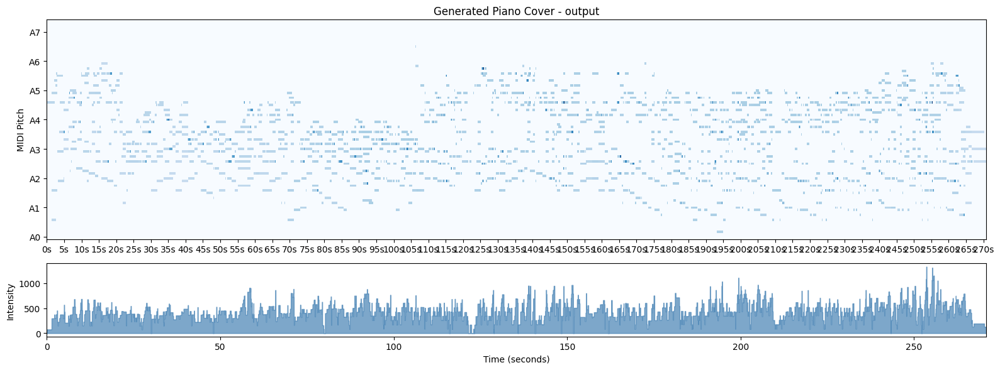


Statistics:
  Total notes: 2206
  Duration: 270.80 seconds
  Pitch range: 23 - 99 (MIDI)
  Average velocity: 83.5


In [18]:
import pretty_midi

def visualize_midi(midi_path, title="Piano Roll", figsize=(16, 6)):
    """Visualize MIDI as piano roll."""
    midi_obj = pretty_midi.PrettyMIDI(str(midi_path))
    piano_roll = midi_obj.get_piano_roll(fs=100)
    
    fig, axes = plt.subplots(2, 1, figsize=figsize, height_ratios=[3, 1])
    
    # Piano roll
    ax1 = axes[0]
    ax1.imshow(piano_roll, aspect='auto', origin='lower', cmap='Blues', interpolation='nearest')
    ax1.set_ylabel('MIDI Pitch')
    ax1.set_title(title)
    
    pitch_ticks = [21, 33, 45, 57, 69, 81, 93, 105]
    pitch_labels = ['A0', 'A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7']
    ax1.set_yticks(pitch_ticks)
    ax1.set_yticklabels(pitch_labels)
    ax1.set_ylim(20, 110)
    
    duration = midi_obj.get_end_time()
    x_ticks = np.arange(0, piano_roll.shape[1], 500)
    ax1.set_xticks(x_ticks)
    ax1.set_xticklabels([f"{t/100:.0f}s" for t in x_ticks])
    
    # Note intensity
    ax2 = axes[1]
    velocity_over_time = piano_roll.sum(axis=0)
    time_axis = np.arange(len(velocity_over_time)) / 100
    ax2.fill_between(time_axis, velocity_over_time, alpha=0.7, color='steelblue')
    ax2.set_xlabel('Time (seconds)')
    ax2.set_ylabel('Intensity')
    ax2.set_xlim(0, duration)
    
    plt.tight_layout()
    plt.show()
    
    # Statistics
    notes = midi_obj.instruments[0].notes if midi_obj.instruments else []
    print(f"\nStatistics:")
    print(f"  Total notes: {len(notes)}")
    print(f"  Duration: {duration:.2f} seconds")
    if notes:
        pitches = [n.pitch for n in notes]
        print(f"  Pitch range: {min(pitches)} - {max(pitches)} (MIDI)")
        print(f"  Average velocity: {np.mean([n.velocity for n in notes]):.1f}")
    
    return midi_obj


# Visualize result
midi_path = config.paths.infer_output_dir / f"{OUTPUT_NAME}.mid"
if midi_path.exists():
    midi_obj = visualize_midi(midi_path, title=f"Generated Piano Cover - {OUTPUT_NAME}")
else:
    print(f"MIDI file not found: {midi_path}")

## 7. Play MIDI (Optional)

This requires FluidSynth to be installed for high-quality synthesis.

In [21]:
! uv pip install pyfluidsynth

Resolved 2 packages in 331ms
Prepared 1 package in 52ms
Installed 1 package in 19ms
 + pyfluidsynth==1.3.4


In [22]:
def midi_to_audio(midi_obj, sample_rate=22050):
    """Convert MIDI to audio waveform."""
    if isinstance(midi_obj, (str, Path)):
        midi_obj = pretty_midi.PrettyMIDI(str(midi_obj))
    
    try:
        audio = midi_obj.fluidsynth(fs=sample_rate)
        print("Using FluidSynth for synthesis")
    except Exception as e:
        print(f"FluidSynth not available ({e}), using simple synthesis")
        audio = midi_obj.synthesize(fs=sample_rate)
    
    if len(audio) > 0 and np.abs(audio).max() > 0:
        audio = audio / np.abs(audio).max() * 0.9
    
    return audio, sample_rate


# Play the result
if midi_path.exists():
    print("Rendering MIDI to audio...")
    audio, sr = midi_to_audio(midi_obj)
    print(f"Duration: {len(audio)/sr:.2f} seconds")
    display(Audio(audio, rate=sr))

Rendering MIDI to audio...
FluidSynth not available (fluidsynth() was called but pyfluidsynth is not installed.), using simple synthesis
Duration: 271.80 seconds


## 8. Quick Re-generation (Decode Only)

After running the full pipeline once, you can quickly regenerate with different attributes:

[SKIP] Skipping Stages 1 & 2 (decode-only mode).
 • Verifying intermediate files
[INFO] All required intermediate files found.

========================= Stage 3: Decoding with target attributes =========================

 • Loading vocabulary
 • Loading decoder model
    | Loading model configuration...
    | Loading checkpoint weights...
[INFO] Model and vocabulary loaded.
 • Preparing input sequence
    | Tokenizing condition events...
[INFO] Prepared 150 bars for generation.
 • Generating piano cover
    | Generating 150 bars...


Generating Bars: 100%|██████████| 150/150 [00:50<00:00,  2.94bar/s, Generated Tokens=9423]


 • Exporting to MIDI
    | Decoding events to notes...
[INFO] Final MIDI saved to: C:\Users\chen\Desktop\Etude\outputs\infer\output_v2.mid
[SUCCESS] Inference pipeline finished successfully!


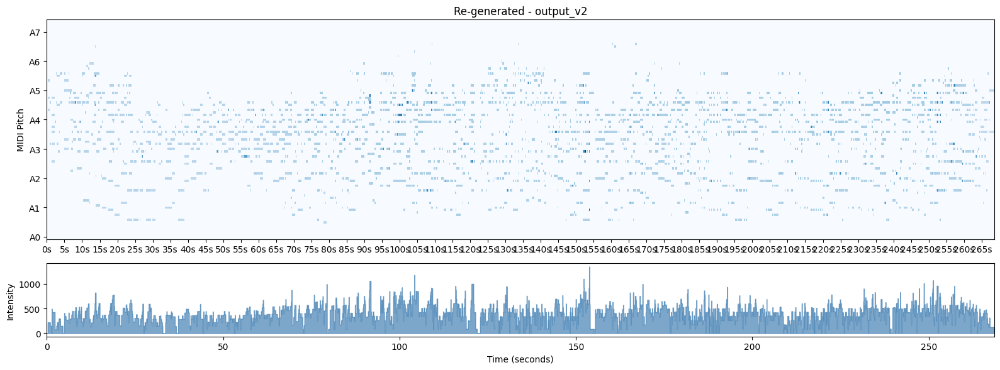


Statistics:
  Total notes: 3931
  Duration: 268.56 seconds
  Pitch range: 27 - 100 (MIDI)
  Average velocity: 82.8


In [20]:
# New attributes for experimentation
NEW_ATTRIBUTES = {
    "polyphony_bin": 2,           # Higher texture density
    "rhythm_intensity_bin": 2,    # More rhythmic complexity
    "sustain_bin": 0,             # Shorter notes (staccato)
    "pitch_overlap_bin": 2,
}

NEW_OUTPUT_NAME = "output_v2"

# Run decode only (much faster)
pipeline.run(
    audio_source=None,  # Not used in decode-only mode
    target_attributes=NEW_ATTRIBUTES,
    final_filename=NEW_OUTPUT_NAME,
    decode_only=True,
)

# Visualize new result
new_midi_path = config.paths.infer_output_dir / f"{NEW_OUTPUT_NAME}.mid"
if new_midi_path.exists():
    visualize_midi(new_midi_path, title=f"Re-generated - {NEW_OUTPUT_NAME}")

## Tips

### Controllable Attributes

| Attribute | 0 (Low) | 1 (Neutral) | 2 (High) |
|-----------|---------|-------------|----------|
| `polyphony_bin` | Simple | Normal | Complex |
| `rhythm_intensity_bin` | Sparse | Normal | Dense |
| `sustain_bin` | Staccato | Normal | Legato |
| `pitch_overlap_bin` | - | - | Keep at 2 |

### Troubleshooting

1. **Out of Memory**: Reduce batch size or use a smaller audio file
2. **Beat detection fails**: Try using `demucs` backend instead of `spleeter`
3. **No sound in playback**: Install FluidSynth for better synthesis